In [1]:
import tensorflow as tf

import os
import numpy as np
import matplotlib.pyplot as plt
import statistics
import pickle

import math
import cv2
import numpy as np
from numpy import cos as cos
from numpy import sin as sin
from numpy import sqrt as sqrt
from numpy import arctan2 as arctan2
import os
import datetime
import time

import sys
from functions import *
from tf_functions import *
from zernike_functions import *

In [2]:
def init_param():
    ### N: pix num, p: pix size[m]
    N = 2160
    p = 3.74e-6

    ### l_ambda: wavelength
    l_ambda = 520e-9

    ### z: distance from aperture to screen
    z = 0.0254

    ### pupil_r: pupil radius, pupil_r_m: (m)
    pupil_r_m = N*p/2
    pupil_r_mm = pupil_r_m*1000

    ### focus length of lens
    lens_f = 0.0254

    ##### Zernike Efficients Setting #####
    nm_arr = [[2,2]]
    nm_coeff_arr = [0.0]

    return N, z, p, l_ambda, pupil_r_m, pupil_r_mm, lens_f, nm_arr, nm_coeff_arr

In [3]:
# gpu_id = 0
# print(tf.__version__)
# if tf.__version__ >= "2.1.0":
#     physical_devices = tf.config.list_physical_devices('GPU')
#     tf.config.list_physical_devices('GPU')
#     tf.config.set_visible_devices(physical_devices[gpu_id], 'GPU')
#     tf.config.experimental.set_memory_growth(physical_devices[gpu_id], True)
#     print('set gpu_id')
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


lens:  4320 0.008078400000000001
False
0.05810233846153847
944.2649203580313
max:  223
max:  0.8745098039215686


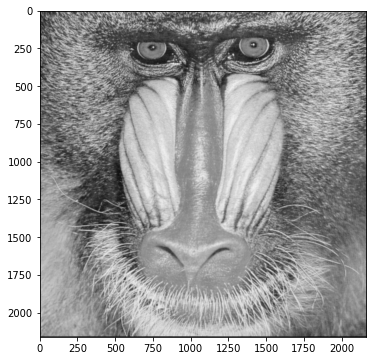

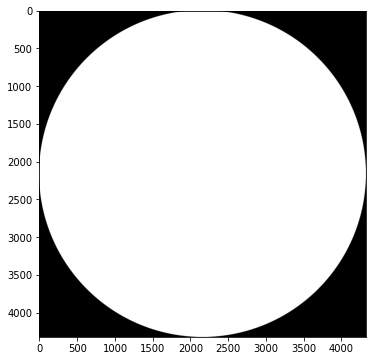

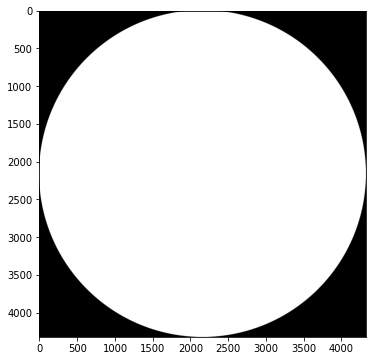

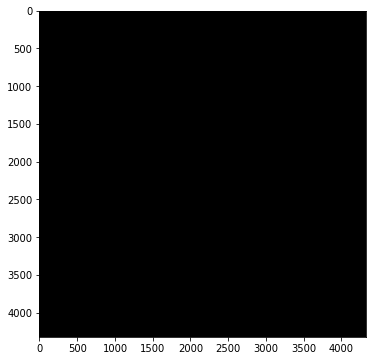

In [4]:
##### Initialization #####
### Initial Params
N, z, p, l_ambda, pupil_r_m, pupil_r_mm, lens_f, nm_arr, nm_coeff_arr = init_param()
back_z = z * -1.0
k = 2*np.pi/l_ambda

### lens override
lens_pad = 1
if lens_pad == False:
    o_lens_N = N
elif lens_pad == 1:
    o_lens_N = 2*N
    pupil_r_m = 2*pupil_r_m
else:
    o_lens_N = 4*N
    pupil_r_m = 4*pupil_r_m
print("lens: ", o_lens_N, pupil_r_m)
### Pupil Function(ふつうの)
p_xy = CGH.pupil_func(o_lens_N, p, pupil_r_m)
# p_xy = CGH.big_pupil_func(N)

### Wavefront Aberration
W_xy = np.zeros((o_lens_N, o_lens_N,))

for i in range(len(nm_arr)):
    nm = nm_arr[i]
    nm_coeff = nm_coeff_arr[i]
    temp_W_xy = CGH.norm_wave_aberration(o_lens_N, nm)
    temp_W_xy = CGH.resize_and_add_pad(temp_W_xy, o_lens_N, p, pupil_r_m)
    W_xy += temp_W_xy * nm_coeff

# W_xy = W_xy * 0.5
# W_xy = W_xy * 2.0

### Reverse Wavefront Aberration
rev_W_xy = W_xy * -1.0

### Generalized Pupil Function
P_xy = CGH.general_pupil(p_xy, W_xy, l_ambda)
rev_P_xy = CGH.general_pupil(p_xy, rev_W_xy, l_ambda)

###

### Directory and Path for Save
dir_fn = ''
fn = ''
out_path = PreProcess.mkdir_out_dir(dir_fn, fn, N, p, z)


##### Check Aliasing #####
CGH.check_aliasing(lens_f, N, l_ambda, p, z)


##### Input Image #####
in_dir = '../input/'
#in_dir = 'drive/My Drive/Colab Notebooks/input/'
amp_img_np = cv2.imread(in_dir + 'baboon_gray.png', cv2.IMREAD_GRAYSCALE)
# amp_img_np = cv2.imread(in_dir + 'peppers_gray.png', cv2.IMREAD_GRAYSCALE)
#amp_img_np = cv2.imread(in_dir + 'USAF_1951.png', cv2.IMREAD_GRAYSCALE)
#amp_img_np = cv2.imread(in_dir + 'white2160.png', cv2.IMREAD_GRAYSCALE)
size = (N, N)
half_size =(N//2, N//2)
amp_img_np = cv2.resize(amp_img_np, size)
print("max: ",amp_img_np.max())
#amp_img_np = cv2.resize(amp_img_np, half_size)
#amp_img_np = ImageProcess.add_zero_padding(amp_img_np)
amp_img_np = amp_img_np / 255.0
amp_img = tf.constant(amp_img_np)
amp_img = tf.dtypes.cast(amp_img, tf.float64)
print("max: ",amp_img_np.max())
cv2.imwrite('../output/check.png', amp_img_np)

##### Initial Random Phase #####
# phase = np.random.uniform(-np.pi, np.pi, size)
random_phase = np.random.uniform(0.0, 2.0*np.pi, size)
init_phase = tf.constant(random_phase)
phase = tf.Variable(random_phase)



##### Incident Light toward SLM #####
light_img = tf.fill(size, 1.0)
light_img = tf.dtypes.cast(light_img, tf.complex128)



##### Target Image #####
source_amp = np.sqrt(amp_img)
source_img = source_amp

# When using Intensity Distribution
goal_img = amp_img
goal_img_tf = tf.constant(goal_img)
goal_img_tf = tf.dtypes.cast(goal_img_tf, tf.complex128)

target = amp_img

abe_imgs = [
    amp_img_np,
    CGH.amp_abs(CGH.intensity(P_xy)),
    CGH.amp_abs(CGH.amplitude(P_xy)),
    CGH.phase_norm(CGH.phase(P_xy)),]
ImageProcess.show_imgs(abe_imgs)

(4320, 4320) (4320, 4320) (4320, 4320)


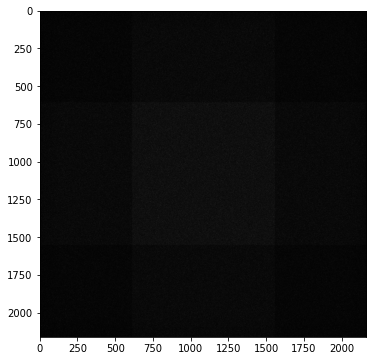

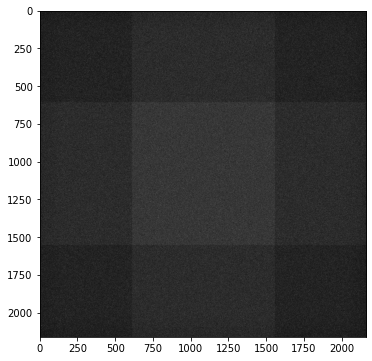

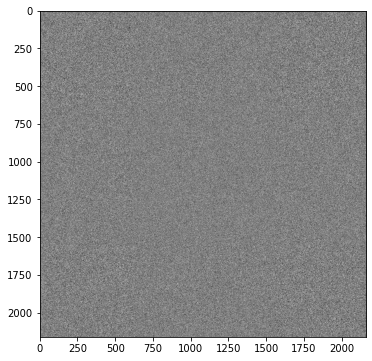

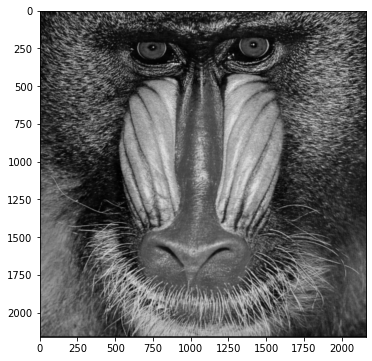

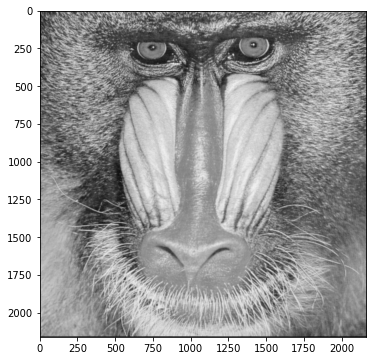

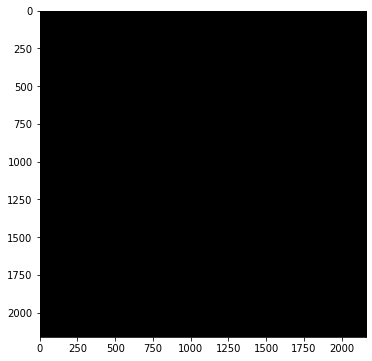

PSNR:  6.356135748520159
tf.Tensor(0.1157061463628743, shape=(), dtype=float64)


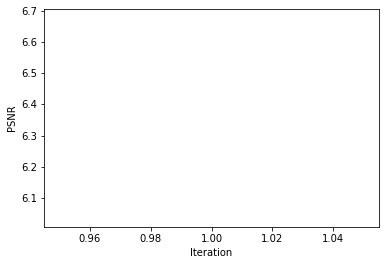

1
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  6.985195796791343
tf.Tensor(0.10010376791173038, shape=(), dtype=float64)
2
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  7.197955381714156
tf.Tensor(0.09531790012300594, shape=(), dtype=float64)
3
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  7.3029417667263345
tf.Tensor(0.09304131238544087, shape=(), dtype=float64)
4
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  7.48445104699459
tf.Tensor(0.08923287784817874, shape=(), dtype=float64)
5
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  7.5906152603674055
tf.Tensor(0.08707800654725883, shape=(), dtype=float64)
6
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  7.643906977526434
tf.Tensor(0.0860160126523526, shape=(), dtype=float64)
7
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  7.755893409233035
tf.Tensor(0.08382637066519946, shape=(), dtype=float64)
8
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  7.8830710474914785
tf.Tensor(0.08140721539738174, shape=(), dtype=float64)
9
(4320, 4320) (4320, 4

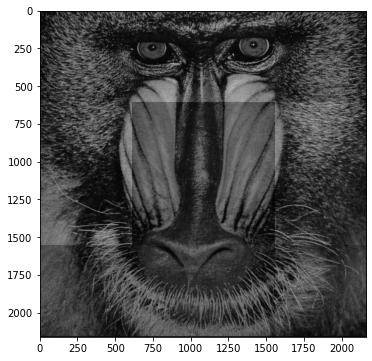

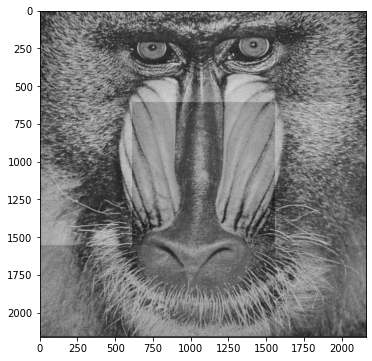

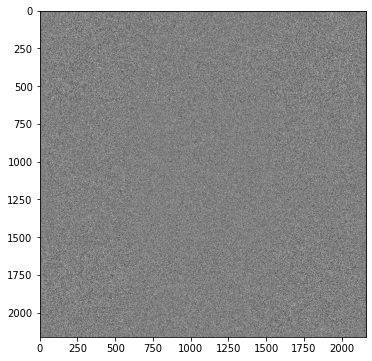

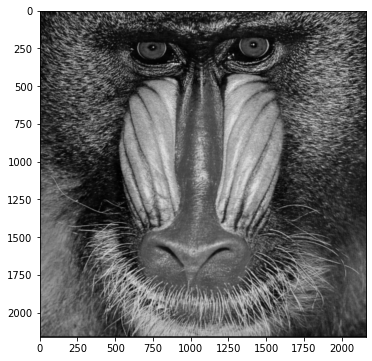

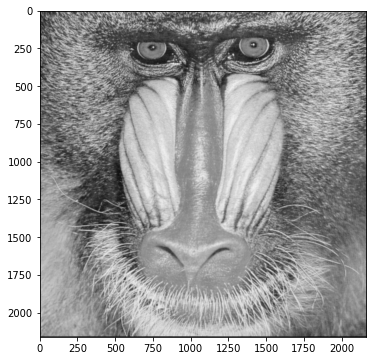

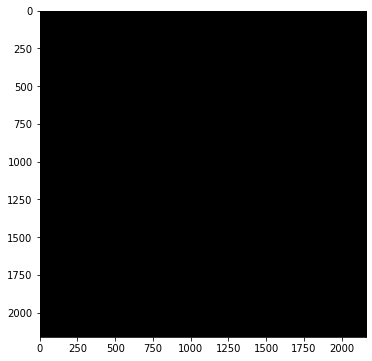

PSNR:  11.042936919441988
tf.Tensor(0.03932568646790259, shape=(), dtype=float64)


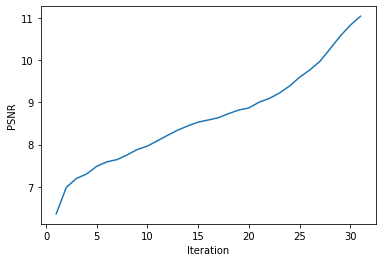

31
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  11.277643250660635
tf.Tensor(0.03725681105087811, shape=(), dtype=float64)
32
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  11.477351860251883
tf.Tensor(0.03558236565543718, shape=(), dtype=float64)
33
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  11.650910714360752
tf.Tensor(0.03418841231145072, shape=(), dtype=float64)
34
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  11.896058088050292
tf.Tensor(0.032312026439871355, shape=(), dtype=float64)
35
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  11.976740777199371
tf.Tensor(0.03171727930298977, shape=(), dtype=float64)
36
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  12.051218464585169
tf.Tensor(0.031177993191811564, shape=(), dtype=float64)
37
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  12.14465188616985
tf.Tensor(0.030514398651582827, shape=(), dtype=float64)
38
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  12.261573391181951
tf.Tensor(0.02970384467310079, shape=(), dtype=float64)
39
(43

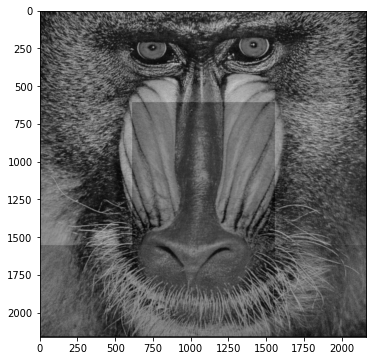

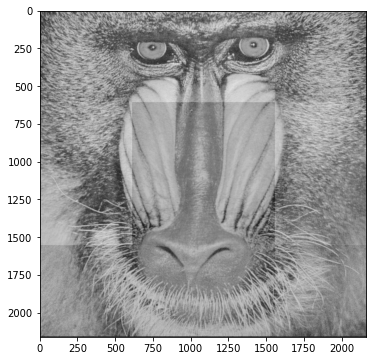

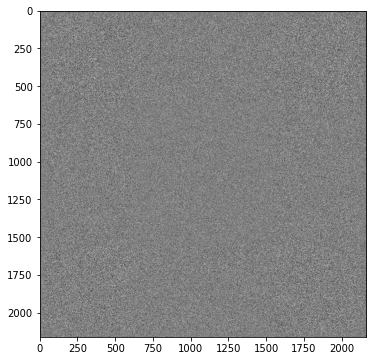

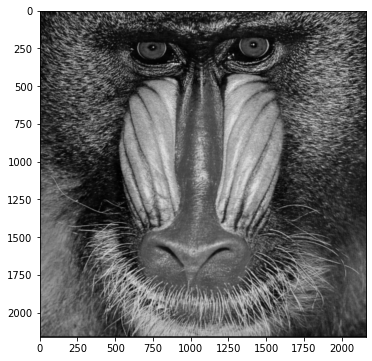

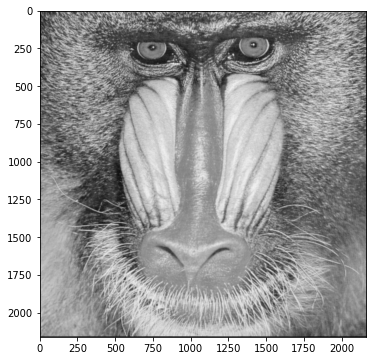

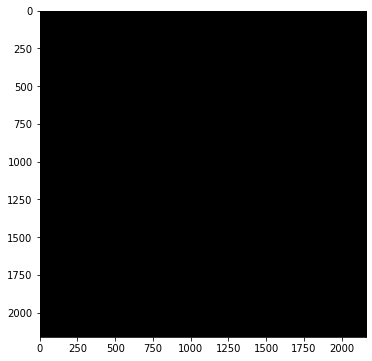

PSNR:  14.671559865135277
tf.Tensor(0.017053519330562494, shape=(), dtype=float64)


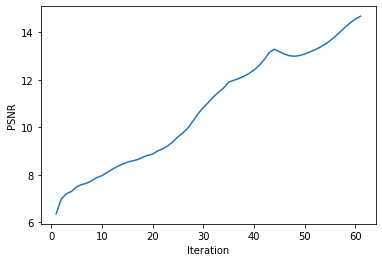

61
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.750707051048217
tf.Tensor(0.01674554548545513, shape=(), dtype=float64)
62
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.788626217244218
tf.Tensor(0.016599973036491886, shape=(), dtype=float64)
63
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.782788602253644
tf.Tensor(0.016622301067841048, shape=(), dtype=float64)
64
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.732412818628948
tf.Tensor(0.016816233244358075, shape=(), dtype=float64)
65
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.6398284112491
tf.Tensor(0.017178576103176604, shape=(), dtype=float64)
66
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.51577506503229
tf.Tensor(0.01767634615875219, shape=(), dtype=float64)
67
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.38044370529126
tf.Tensor(0.0182358341521144, shape=(), dtype=float64)
68
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.257532887005818
tf.Tensor(0.018759303754185334, shape=(), dtype=float64)
69
(4320

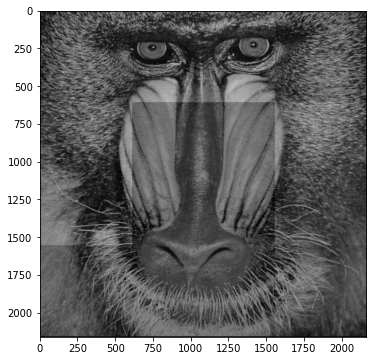

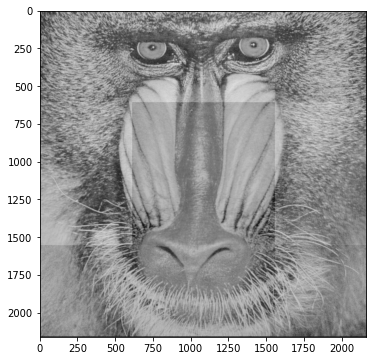

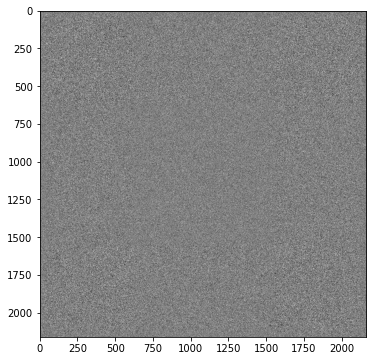

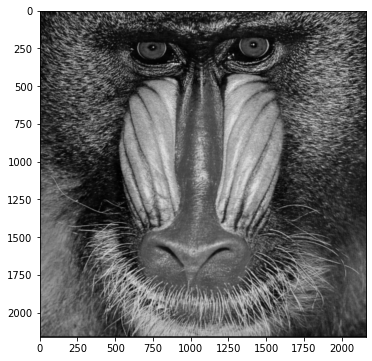

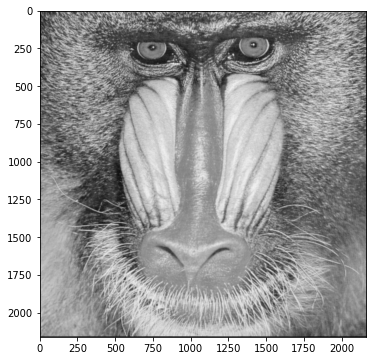

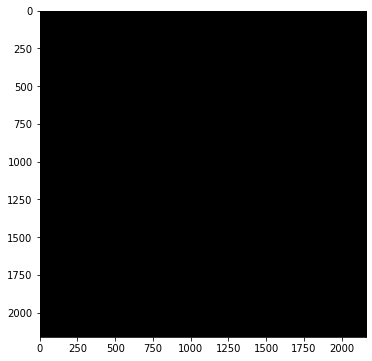

PSNR:  14.35193471733891
tf.Tensor(0.018355935906701926, shape=(), dtype=float64)


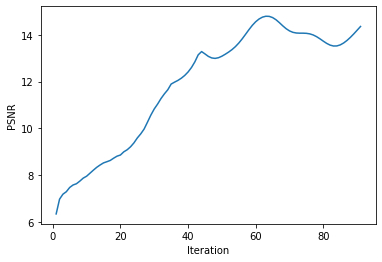

91
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.504619019126723
tf.Tensor(0.01772181107557533, shape=(), dtype=float64)
92
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.643347127084832
tf.Tensor(0.01716466341269104, shape=(), dtype=float64)
93
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.763952170347528
tf.Tensor(0.016694552695431616, shape=(), dtype=float64)
94
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.86758918535827
tf.Tensor(0.016300881330806653, shape=(), dtype=float64)
95
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  14.961341039096418
tf.Tensor(0.01595276253053016, shape=(), dtype=float64)
96
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  15.05431639158757
tf.Tensor(0.015614869722078014, shape=(), dtype=float64)
97
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  15.152069976823256
tf.Tensor(0.01526732696895925, shape=(), dtype=float64)
98
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  15.254232359163346
tf.Tensor(0.014912373355691018, shape=(), dtype=float64)
99
(43

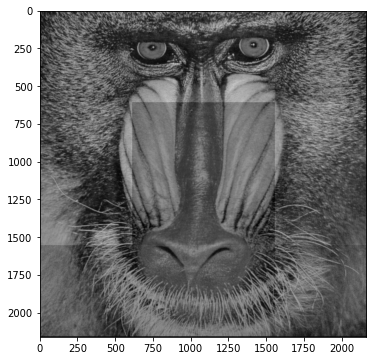

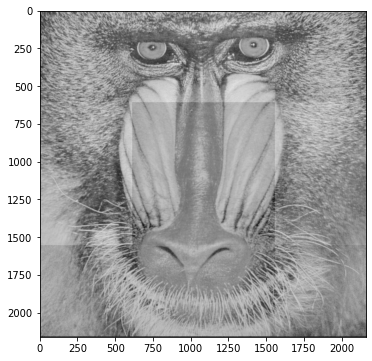

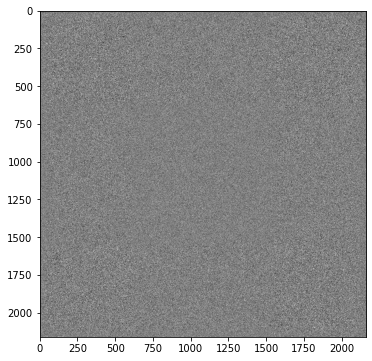

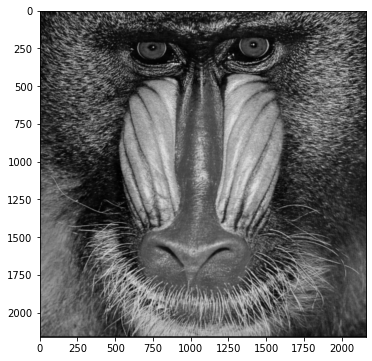

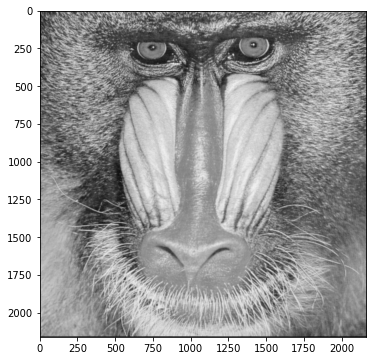

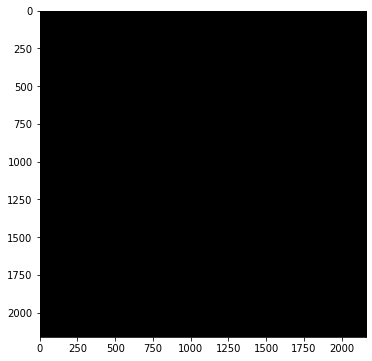

PSNR:  15.736099355022406
tf.Tensor(0.013346274987366754, shape=(), dtype=float64)


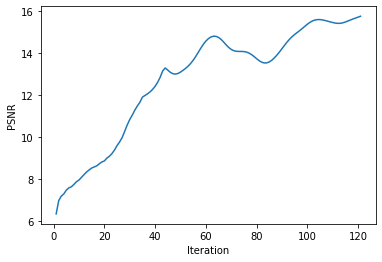

121
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  15.785360103477274
tf.Tensor(0.013195747416130141, shape=(), dtype=float64)
122
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  15.839521313749485
tf.Tensor(0.01303220410099373, shape=(), dtype=float64)
123
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  15.898778565835991
tf.Tensor(0.012855593984828691, shape=(), dtype=float64)
124
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  15.964909712020427
tf.Tensor(0.012661321397166426, shape=(), dtype=float64)
125
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  16.039497647405707
tf.Tensor(0.012445726117236383, shape=(), dtype=float64)
126
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  16.124826239924527
tf.Tensor(0.01220358359259954, shape=(), dtype=float64)
127
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  16.221370128181015
tf.Tensor(0.011935290431286199, shape=(), dtype=float64)
128
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  16.329591400861084
tf.Tensor(0.011641551513883389, shape=(), dtype=flo

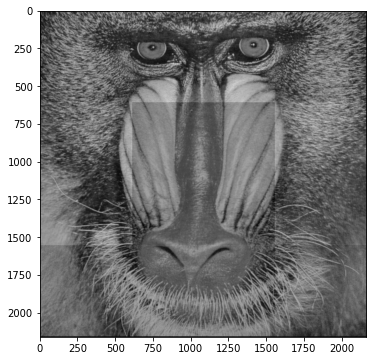

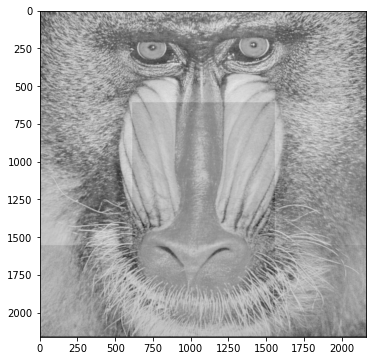

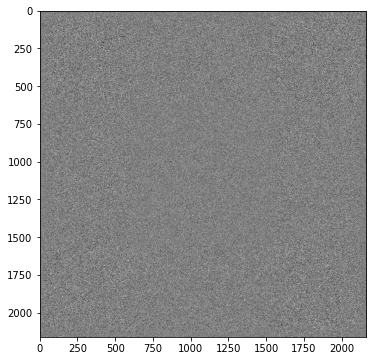

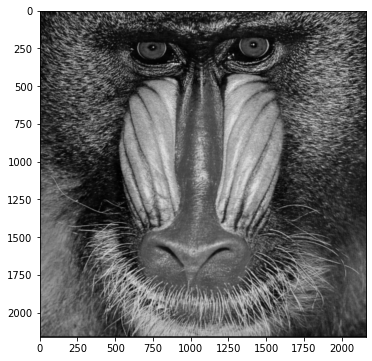

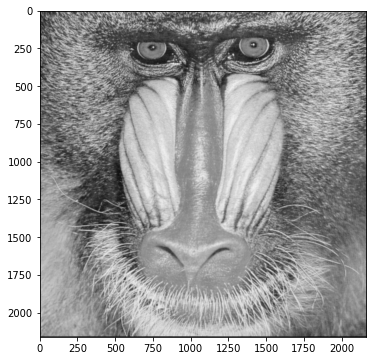

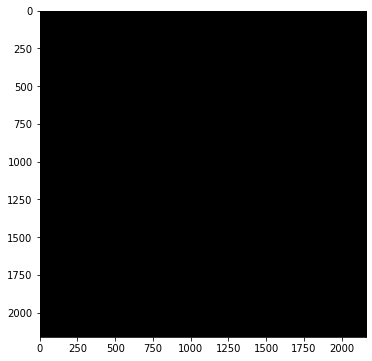

PSNR:  18.238351382342568
tf.Tensor(0.007501271181487114, shape=(), dtype=float64)


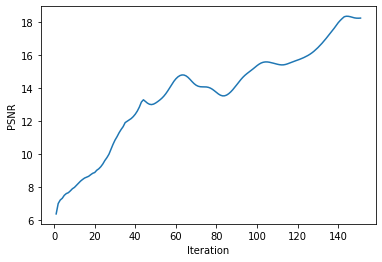

151
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.246347246344257
tf.Tensor(0.007487473178910069, shape=(), dtype=float64)
152
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.257808037236064
tf.Tensor(0.007467740200372082, shape=(), dtype=float64)
153
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.267570125244173
tf.Tensor(0.007450973037037327, shape=(), dtype=float64)
154
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.282386541925927
tf.Tensor(0.007425596564458406, shape=(), dtype=float64)
155
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.30388718084702
tf.Tensor(0.007388925474695467, shape=(), dtype=float64)
156
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.33851793564464
tf.Tensor(0.007330240280617827, shape=(), dtype=float64)
157
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.382089464522966
tf.Tensor(0.007257065750291198, shape=(), dtype=float64)
158
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.43284668644522
tf.Tensor(0.007172744079905871, shape=(), dtype=floa

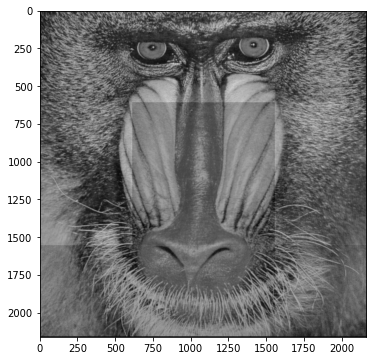

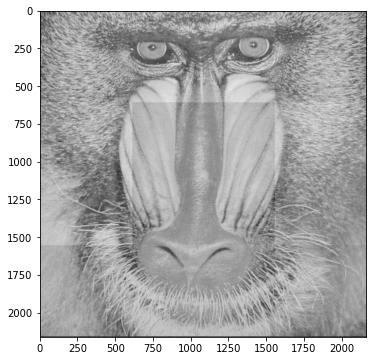

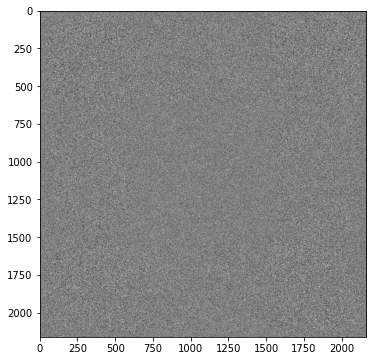

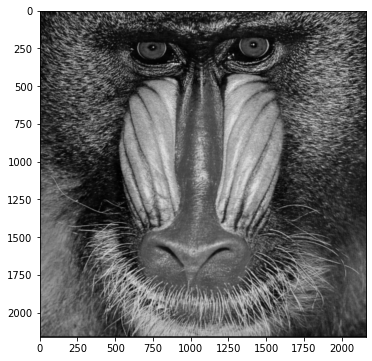

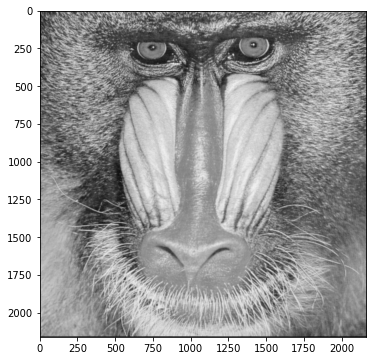

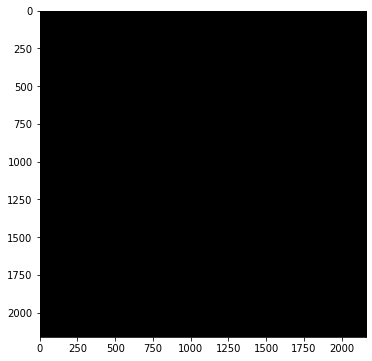

PSNR:  18.452274450063754
tf.Tensor(0.007140729131297527, shape=(), dtype=float64)


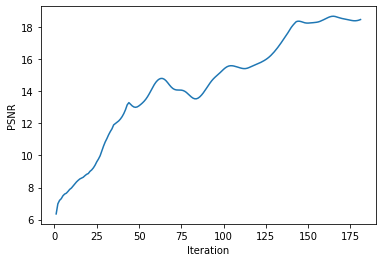

181
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.501400396906508
tf.Tensor(0.007060410703257545, shape=(), dtype=float64)
182
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.559638848507667
tf.Tensor(0.006966363300902391, shape=(), dtype=float64)
183
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.62846537434535
tf.Tensor(0.006856831336932039, shape=(), dtype=float64)
184
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.707185264501863
tf.Tensor(0.00673366455745364, shape=(), dtype=float64)
185
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.798349519187834
tf.Tensor(0.006593789102164175, shape=(), dtype=float64)
186
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  18.905621419156848
tf.Tensor(0.00643291573236498, shape=(), dtype=float64)
187
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  19.026302795872247
tf.Tensor(0.006256619224015072, shape=(), dtype=float64)
188
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  19.162650321444637
tf.Tensor(0.006063242974082018, shape=(), dtype=floa

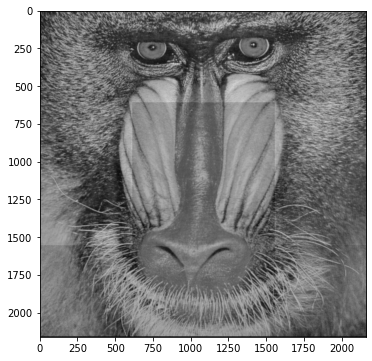

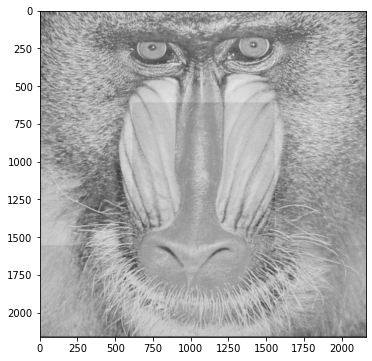

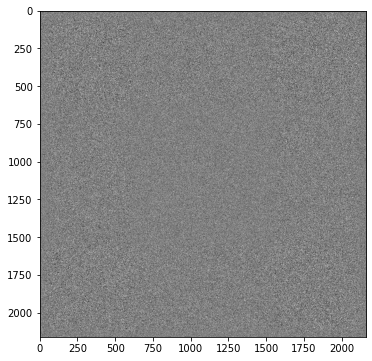

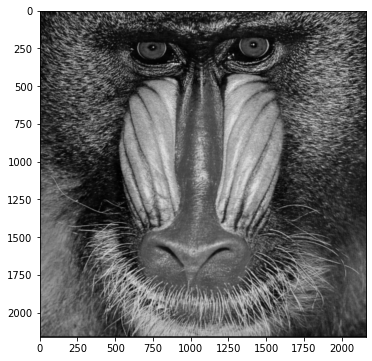

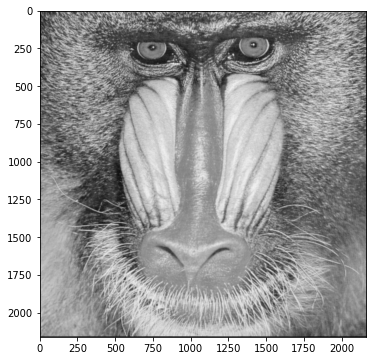

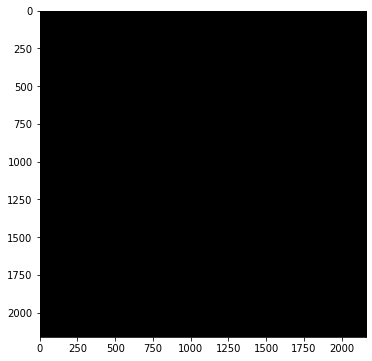

PSNR:  20.826013245034076
tf.Tensor(0.004133982937824147, shape=(), dtype=float64)


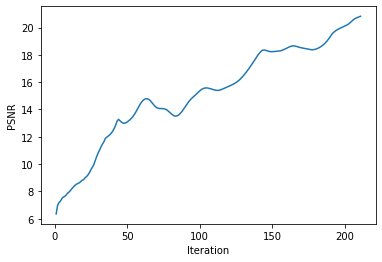

211
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  20.87995042864325
tf.Tensor(0.004082958460340238, shape=(), dtype=float64)
212
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  20.93962907680006
tf.Tensor(0.00402723615039071, shape=(), dtype=float64)
213
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  20.996061812923678
tf.Tensor(0.003975244295559642, shape=(), dtype=float64)
214
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.054136968554957
tf.Tensor(0.003922439985550948, shape=(), dtype=float64)
215
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.106201138310784
tf.Tensor(0.0038756976578732346, shape=(), dtype=float64)
216
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.162432046116564
tf.Tensor(0.00382583996679971, shape=(), dtype=float64)
217
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.223994881565822
tf.Tensor(0.003771989856515138, shape=(), dtype=float64)
218
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.287345137062225
tf.Tensor(0.003717367439540797, shape=(), dtype=floa

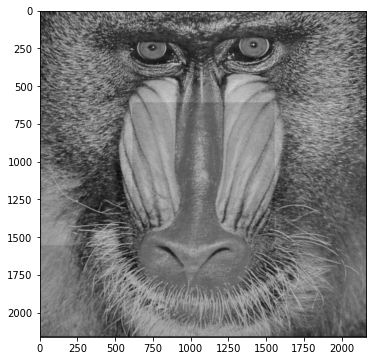

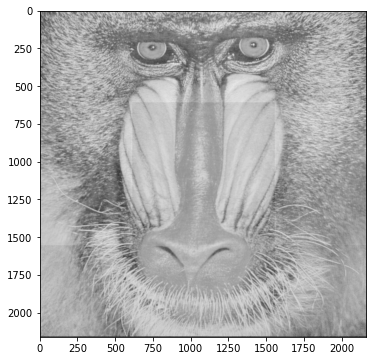

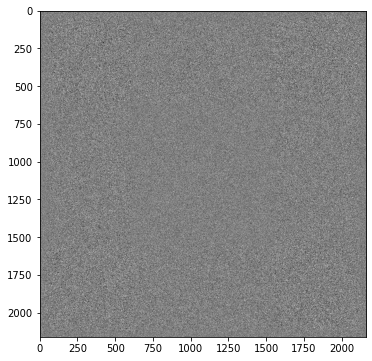

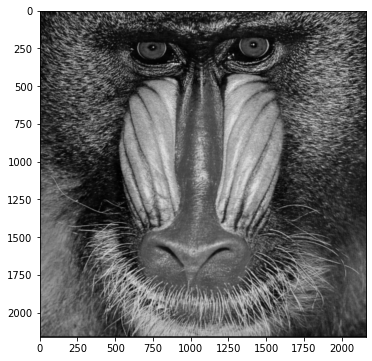

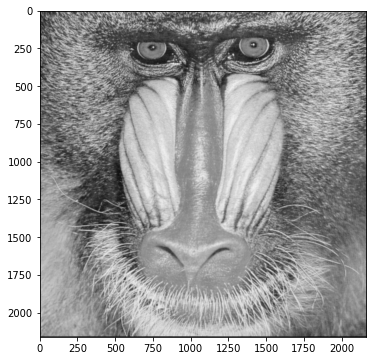

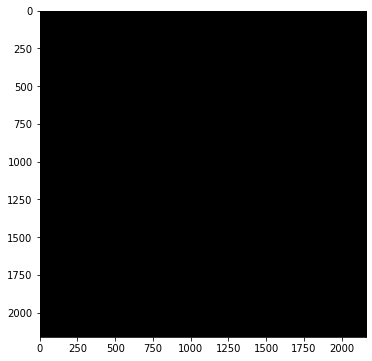

PSNR:  22.011501841834843
tf.Tensor(0.0031464426489378724, shape=(), dtype=float64)


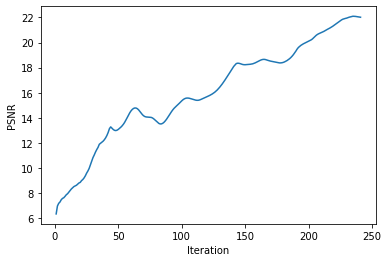

241
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  22.009386421473348
tf.Tensor(0.003147975634146282, shape=(), dtype=float64)
242
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  22.009024794861812
tf.Tensor(0.0031482377694499086, shape=(), dtype=float64)
243
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  22.017441124118136
tf.Tensor(0.003142142608442104, shape=(), dtype=float64)
244
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  22.025313180018884
tf.Tensor(0.003136452294774513, shape=(), dtype=float64)
245
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  22.033500472100542
tf.Tensor(0.0031305450446669917, shape=(), dtype=float64)
246
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  22.04727267881447
tf.Tensor(0.003120633285295852, shape=(), dtype=float64)
247
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  22.055193792850837
tf.Tensor(0.0031149467374798415, shape=(), dtype=float64)
248
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  22.077229660657835
tf.Tensor(0.0030991816950257612, shape=(), dtyp

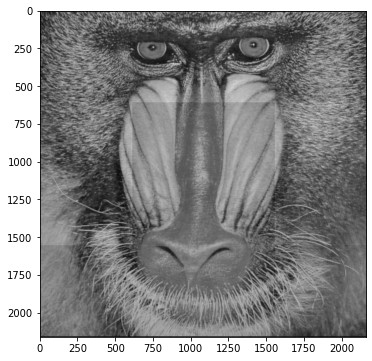

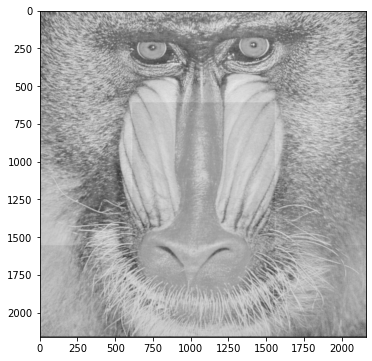

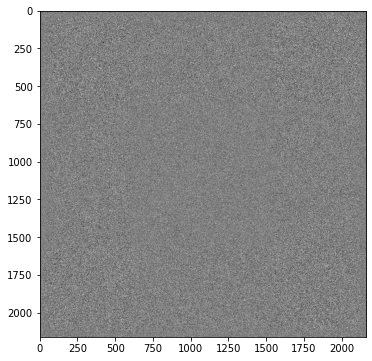

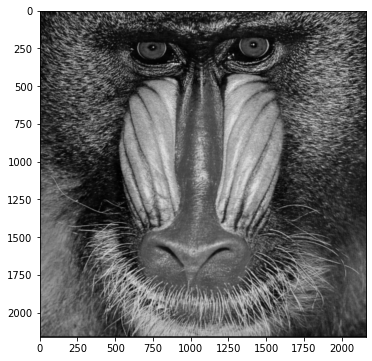

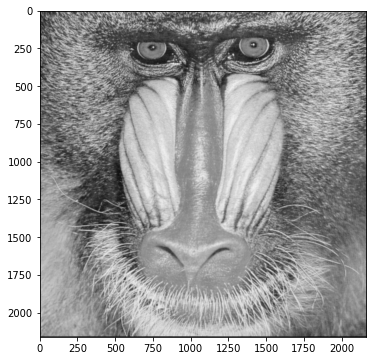

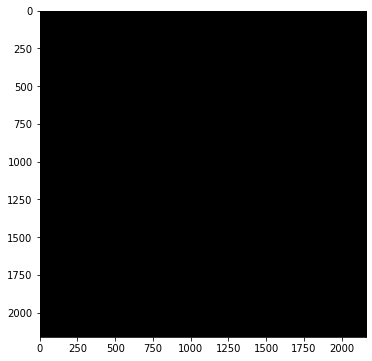

PSNR:  21.623490296523414
tf.Tensor(0.003440495345812349, shape=(), dtype=float64)


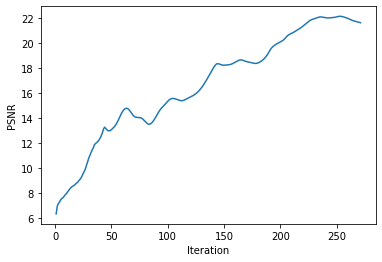

271
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.593410648815606
tf.Tensor(0.0034644072553664546, shape=(), dtype=float64)
272
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.56672365088795
tf.Tensor(0.0034857612624886966, shape=(), dtype=float64)
273
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.53700400418589
tf.Tensor(0.003509696833913378, shape=(), dtype=float64)
274
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.512270311518474
tf.Tensor(0.0035297420860926215, shape=(), dtype=float64)
275
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.487569751551195
tf.Tensor(0.003549874742148709, shape=(), dtype=float64)
276
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.468387794241405
tf.Tensor(0.0035655885373575814, shape=(), dtype=float64)
277
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.447875991009173
tf.Tensor(0.003582468704755498, shape=(), dtype=float64)
278
(4320, 4320) (4320, 4320) (4320, 4320)
PSNR:  21.435091338923012
tf.Tensor(0.003593030224061543, shape=(), dtype

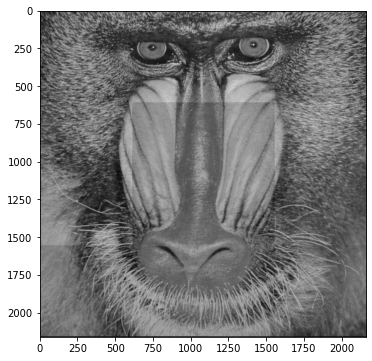

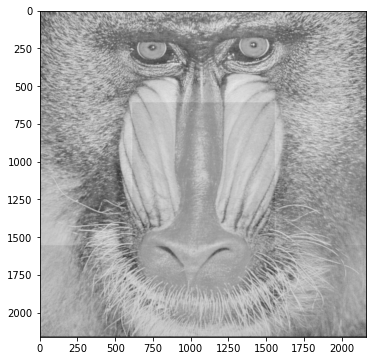

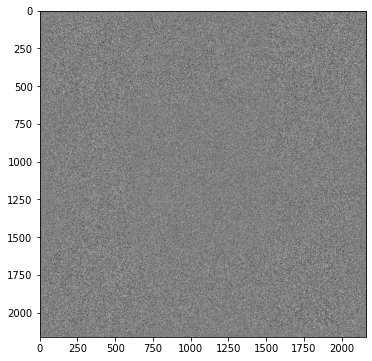

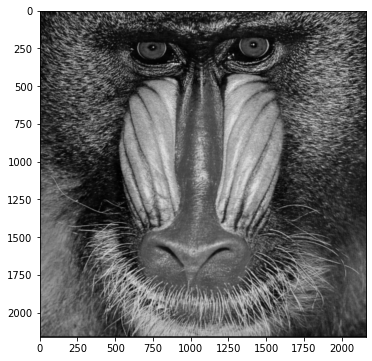

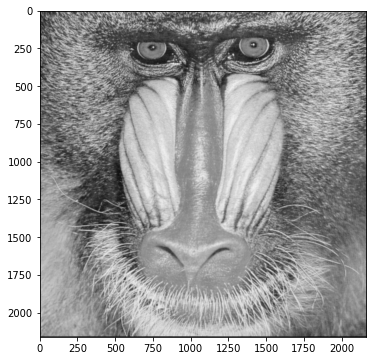

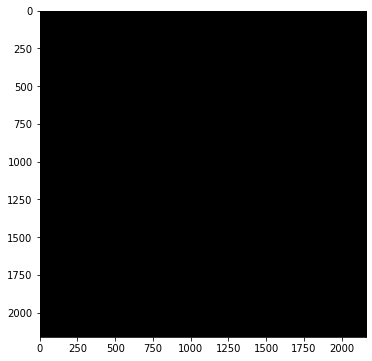

PSNR:  20.72135661269263
tf.Tensor(0.00423481402837057, shape=(), dtype=float64)


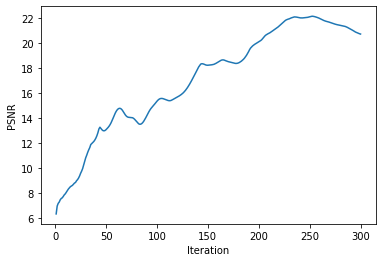

300


In [5]:
# opt = tf.keras.optimizers.Adam(learning_rate=1.0)
opt = tf.keras.optimizers.Adam(learning_rate=0.1)

list_PSNR =[]
list_iter =[]

def loss_func():
    # phase: なんでもあり(定義域がない)の値, phase_exp: 複素振幅の形に, np.exp(phase)
    phase_exp = tf.dtypes.complex(tf.math.cos(phase), tf.math.sin(phase))
    

    # Input Complex Amplitude: SLMに光があたった状態（light_img: amplitude, A exp(iφ), exp(iφ): phase_exp）
    init_plane = tf.math.multiply(light_img, phase_exp)

    # Propagation from SLM to Image Plane with normalization
    init_plane_add = tf_CGH.add_zero_padding(init_plane)
    N = init_plane_add.shape[0]
    prop = tf_CGH.band_limited_angular_spectrum(init_plane_add, k, N, l_ambda, z, p)
#     prop = tf_CGH.angular_spectrum(init_plane_add, k, N, l_ambda, z, p)
#     prop = tf_CGH.normalize_amp_one(prop)
    prop_rm = tf_CGH.remove_zero_padding(prop)
    N = prop_rm.shape[0]

    '''
    # 1. prop_rmをレンズで変換します

    # 2. レンズで変換した直後の面から，再度伝播します

    # 3. 伝播結果を比較します
    '''

    ### 収差あり(P_xy:一般化瞳関数)/なし(p_xy: 瞳関数)レンズ変換
    
    u_minus = prop_rm
    u_minus = tf_CGH.add_zero_padding(u_minus)
    #u_minus = tf_CGH.add_zero_padding(u_minus)
    
    lens = tf_CGH.response_h(o_lens_N, l_ambda, -1.0*lens_f, p)
    print(u_minus.shape, lens.shape, P_xy.shape)
    u_plus = u_minus * lens * P_xy
    #u_plus = u_minus * lens * p_xy
    
    #u_plus = tf_CGH.remove_zero_padding(u_plus)
    u_plus = tf_CGH.remove_zero_padding(u_plus)


    ###レンズからimageplaneまで伝搬計算
    u_plus_add = tf_CGH.add_zero_padding(u_plus)
    N = init_plane_add.shape[0]
    image_plane = tf_CGH.band_limited_angular_spectrum(u_plus_add, k, N, l_ambda, z, p)
    image_plane_rm = tf_CGH.remove_zero_padding(image_plane)
    N = image_plane_rm.shape[0]

    ### Show Images(強度、振幅、位相)
    
    if i % (loop//10) == 0 or i == loop-1:
        imgs = [
            CGH.amp_abs(CGH.intensity(image_plane_rm.numpy())),
            CGH.amp_abs(CGH.amplitude(image_plane_rm.numpy())),
            CGH.phase_norm(CGH.phase(image_plane_rm.numpy())),

            CGH.amp_abs(CGH.intensity(goal_img_tf.numpy())),
            CGH.amp_abs(CGH.amplitude(goal_img_tf.numpy())),
            CGH.phase_norm(CGH.phase(goal_img_tf.numpy())),
        ]
        ImageProcess.show_imgs(imgs)
    
    # Calculate Loss
    prop_inten = image_plane_rm * tf.math.conj(image_plane_rm)
    prop_inten = tf.dtypes.cast(prop_inten, tf.float64)
    prop_inten_norm = tf_CGH.normalize_amp_one(prop_inten)

    # PSNR value
    psnr_val = cv2.PSNR(prop_inten_norm.numpy(), target.numpy(), R=1)
    list_PSNR.append(psnr_val)
    print('PSNR: ', psnr_val)

    # target: これもintensity, それを二乗誤差で扱う
    err = prop_inten_norm - target
    loss = 1/2 * ( err ** 2 )
    print(tf.reduce_mean(loss))
    
    return loss

loop = 300
for i in range(loop):
    step_count = opt.minimize(loss_func, [phase]).numpy()
    list_iter.append(step_count)
    if i % (loop//10) == 0 or i == loop-1:
        plt.plot(list_iter, list_PSNR)
        plt.xlabel('Iteration')
        plt.ylabel('PSNR')
        plt.show()
    print(step_count)

In [6]:
#save image
phase_exp = tf.dtypes.complex(tf.math.cos(phase), tf.math.sin(phase))
init_plane = tf.math.multiply(light_img, phase_exp)
phase_img = CGH.phase_norm(CGH.phase(init_plane.numpy()))
out_dir = '../output/'
phase_img.min()
cv2.imwrite(out_dir + 'baboon-300step_fz25_4mm.png', phase_img)

True

PSNR:  6.4482473048896995


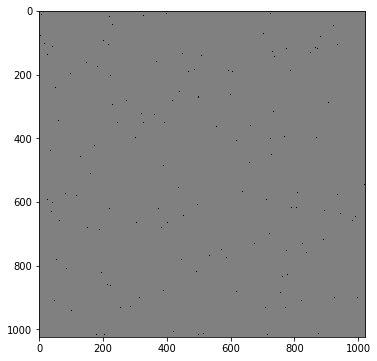

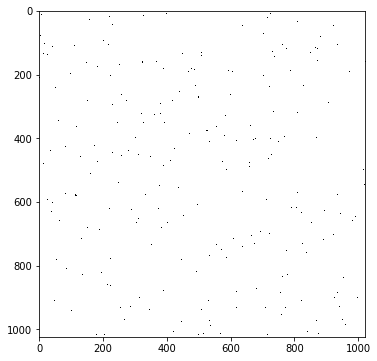

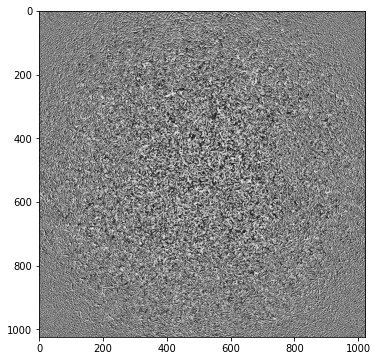

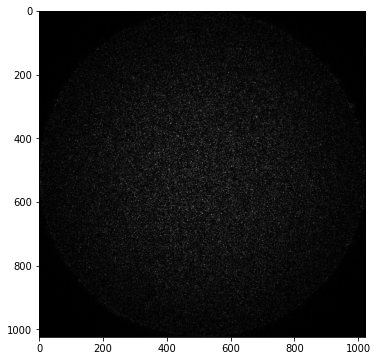

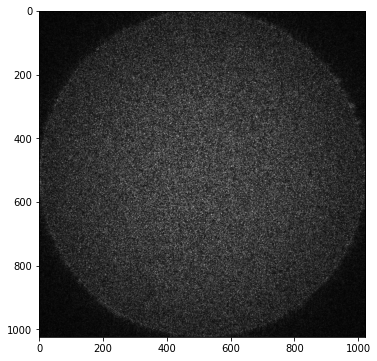

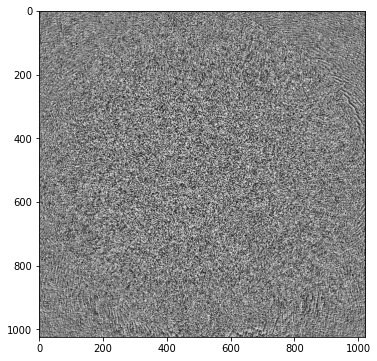

In [ ]:
##### Validate Optimization Result #####
# Input Image
phase_exp = tf.dtypes.complex(tf.math.cos(phase), tf.math.sin(phase))
input_plane = tf.math.multiply(light_img, phase_exp)
input_plane = input_plane.numpy()


# Propagation from SLM to Image Plane
input_plane_add = ImageProcess.add_zero_padding(input_plane)
N = input_plane_add.shape[0]
# recon_img = CGH.propagation(input_plane_add, N, l_ambda, z, p)
recon_img = CGH.band_limited_angular_spectrum(input_plane_add, N, l_ambda, z, p)
# recon_img = CGH.angular_spectrum(input_plane_add, N, l_ambda, z, p)
recon_img = ImageProcess.remove_zero_padding(recon_img)
N = recon_img.shape[0]


# PSNR value
recon_img_inten = ImageProcess.normalize_amp_one(CGH.intensity(recon_img))
psnr_val = cv2.PSNR(recon_img_inten, target.numpy(), R=1)
print('PSNR: ', psnr_val)


##### Check Images #####
imgs = [
        CGH.amp_abs(CGH.intensity(input_plane)),
        CGH.amp_abs(CGH.amplitude(input_plane)),
        CGH.phase_norm(CGH.phase(input_plane)),

        CGH.amp_abs(CGH.intensity(recon_img)),
        CGH.amp_abs(CGH.amplitude(recon_img)),
        CGH.phase_norm(CGH.phase(recon_img))

    ]
ImageProcess.show_imgs(imgs)
opt_out_path = out_path + 'opt_'
ImageProcess.save_imgs(opt_out_path, imgs)

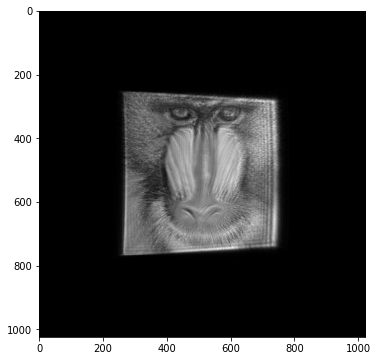

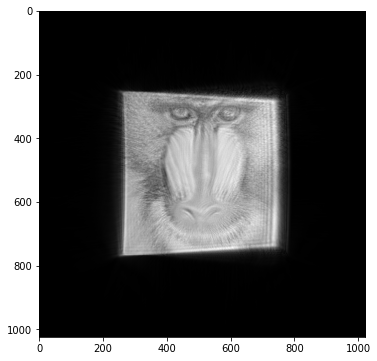

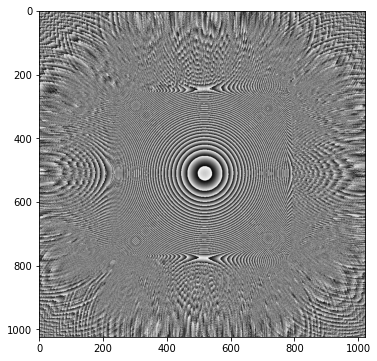

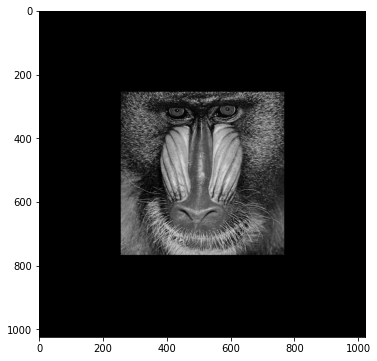

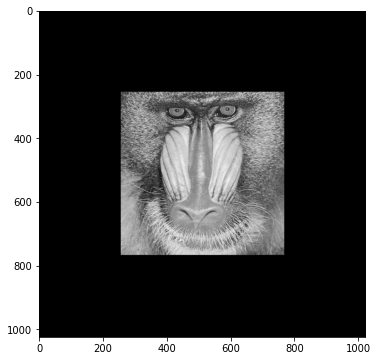

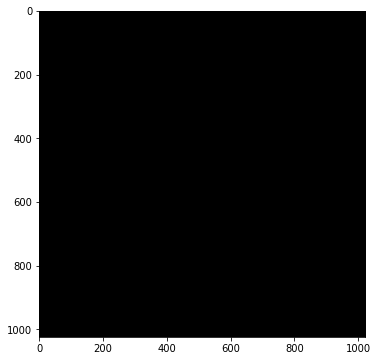

20.10092663476673


In [ ]:
# phase: なんでもあり(定義域がない)の値, phase_exp: 複素振幅の形に, np.exp(phase)
phase = np.zeros(size)
phase = tf.constant(phase)

phase_exp = tf.dtypes.complex(tf.math.cos(phase), tf.math.sin(phase))


# Input Complex Amplitude: source_img: amplitude, A exp(iφ), exp(iφ): phase_exp）
init_plane = tf.math.multiply(source_img, phase_exp)

# Propagation from SLM to Image Plane with normalization
init_plane_add = tf_CGH.add_zero_padding(init_plane)
N = init_plane_add.shape[0]
prop = tf_CGH.band_limited_angular_spectrum(init_plane_add, k, N, l_ambda, z, p)
prop_rm = tf_CGH.remove_zero_padding(prop)
N = prop_rm.shape[0]

'''
# 1. prop_rmをレンズで変換します

# 2. レンズで変換した直後の面から，再度伝播します

# 3. 伝播結果を比較します


'''
### 収差なしレンズ変換
u_minus = prop_rm
lens = CGH.response(N, l_ambda, -1.0*lens_f, p)
u_plus = u_minus * lens * P_xy


###レンズからimageplaneまで伝搬計算
u_plus_add = tf_CGH.add_zero_padding(u_plus)
N = init_plane_add.shape[0]
image_plane = tf_CGH.band_limited_angular_spectrum(u_plus_add, k, N, l_ambda, z, p)
image_plane_rm = tf_CGH.remove_zero_padding(image_plane)
N = image_plane_rm.shape[0]

### Show Images(強度、振幅、位相)

imgs = [
    CGH.amp_abs(CGH.intensity(image_plane_rm.numpy())),
    CGH.amp_abs(CGH.amplitude(image_plane_rm.numpy())),
    CGH.phase_norm(CGH.phase(image_plane_rm.numpy())),

    CGH.amp_abs(CGH.intensity(goal_img_tf.numpy())),
    CGH.amp_abs(CGH.amplitude(goal_img_tf.numpy())),
    CGH.phase_norm(CGH.phase(goal_img_tf.numpy())),
]
for i in range(3):
  imgs[i] = cv2.flip(imgs[i], -1) 
ImageProcess.show_imgs(imgs)

out_dir = 'drive/My Drive/Colab Notebooks/output/'

#cv2.imwrite(out_dir+'target.png', imgs[0])
print(cv2.PSNR(amp_img_np, imgs[0]/imgs[0].max(), R=1))




